In [1]:
!pip install --upgrade descartes geopandas==0.11.0 contextily

  Using cached contextily-1.2.0-py3-none-any.whl (16 kB)
  Using cached descartes-1.1.0-py3-none-any.whl (5.8 kB)
  Using cached geopandas-0.11.0-py3-none-any.whl (1.0 MB)
  Using cached geopy-2.3.0-py3-none-any.whl (119 kB)
  Using cached geographiclib-2.0-py3-none-any.whl (40 kB)
  Using cached mercantile-1.2.1-py3-none-any.whl (14 kB)
  Using cached rasterio-1.3.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (21.0 MB)
  Using cached affine-2.3.1-py2.py3-none-any.whl (16 kB)
  Using cached snuggs-1.4.7-py3-none-any.whl (5.4 kB)
  Using cached xyzservices-2022.9.0-py3-none-any.whl (55 kB)
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.8.1
    Uninstalling geopandas-0.8.1:
      Successfully uninstalled geopandas-0.8.1


In [2]:
import fiona
import geopandas as gpd
import pandas as pd

import numpy as np
import math

import contextily as cx
from matplotlib import pyplot as plt

In [3]:
gdfs = []

for layername in fiona.listlayers('aggregated_water-profiles.gpkg'):
    geopkg = gpd.read_file(r'aggregated_water-profiles.gpkg', layer=layername)
    gdfs.append(geopkg)
    i = 0
    for name in geopkg.columns:
        print(name)
        i += 1

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:639: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry
water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry
water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry


In [4]:
gdf = pd.concat(gdfs)
gdf

,water_valid_pixels,nominal_water_valid_pixels,TIMESTAMP,eopatch,epsg,geometry
0,28,27,2019-01-07 10:36:51,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1..."
1,36,27,2019-01-12 10:36:55,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1..."
2,34,27,2019-01-17 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1..."
3,37,27,2019-01-22 10:36:56,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1..."
4,34,27,2019-01-27 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1..."
...,...,...,...,...,...,...
99158,3,0,2021-12-17 09:44:59,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2..."
99159,3,0,2021-12-22 09:44:54,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2..."
99160,4,0,2021-12-24 09:35:02,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2..."
99161,3,0,2021-12-27 09:45:01,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2..."


In [5]:
gdf['times_overpassing_nominal_water'] = gdf.apply(lambda x: 1 if (x['water_valid_pixels'] > x['nominal_water_valid_pixels']) else 0, axis=1)
gdf['ratio'] = gdf.apply(lambda x: (x['water_valid_pixels']/x['nominal_water_valid_pixels']) if (x['nominal_water_valid_pixels'] > 0) else 0, axis=1)

gdf

,water_valid_pixels,nominal_water_valid_pixels,TIMESTAMP,eopatch,epsg,geometry,times_overpassing_nominal_water,ratio
0,28,27,2019-01-07 10:36:51,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",1,1.037037
1,36,27,2019-01-12 10:36:55,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",1,1.333333
2,34,27,2019-01-17 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",1,1.259259
3,37,27,2019-01-22 10:36:56,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",1,1.370370
4,34,27,2019-01-27 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",1,1.259259
...,...,...,...,...,...,...,...,...
99158,3,0,2021-12-17 09:44:59,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",1,0.000000
99159,3,0,2021-12-22 09:44:54,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",1,0.000000
99160,4,0,2021-12-24 09:35:02,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",1,0.000000
99161,3,0,2021-12-27 09:45:01,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",1,0.000000


In [6]:
gdf['time'] = gdf['TIMESTAMP'].apply(lambda x: pd.to_datetime(x))

In [7]:
gdf_patch_geometries = gdf.groupby(['eopatch']).first().reset_index()[['eopatch','geometry','epsg']]

In [8]:
gdf_patch_geometries

,eopatch,geometry,epsg
0,eopatch-id-0000-col-0-row-11,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631
1,eopatch-id-0001-col-1-row-8,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631
2,eopatch-id-0002-col-1-row-9,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631
3,eopatch-id-0003-col-1-row-10,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631
4,eopatch-id-0004-col-1-row-11,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631
...,...,...,...
1490,eopatch-id-1490-col-13-row-31,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633
1491,eopatch-id-1491-col-13-row-32,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633
1492,eopatch-id-1492-col-14-row-28,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633
1493,eopatch-id-1493-col-14-row-29,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633


# Analysis over the whole period of time (2019-2021)

In [9]:
gdfs_aggregated = []
for gdf in gdfs:
    gdfg = gdf.groupby("eopatch").sum()
    agdf = gdf[["eopatch", "geometry"]].drop_duplicates()
    
    gdfs_aggregated.append(agdf.merge(gdfg, on="eopatch"))

Text(0.5, 1.0, 'Locations with nominal water pixels (in blue).')

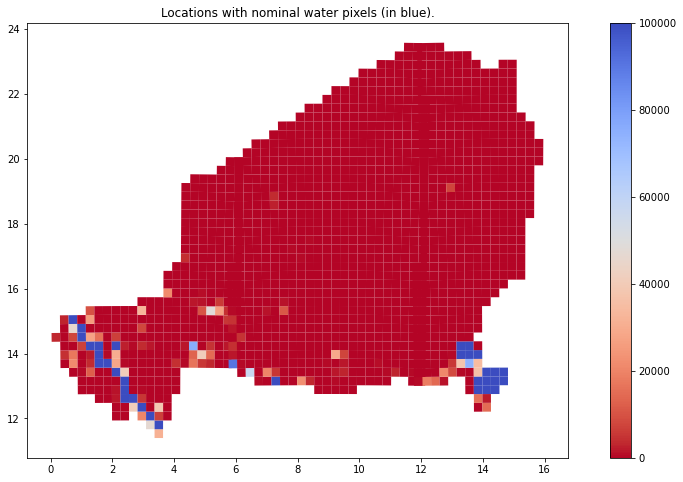

In [10]:
fig, axs = plt.subplots(figsize=(15, 8))
i=0
for gdf in gdfs_aggregated:
    gdf.to_crs(epsg=4326).plot(ax=axs, column="nominal_water_valid_pixels", cmap=plt.cm.coolwarm_r, vmin=0, vmax=1e5, legend=True if i==0 else False)
    i = i+1
axs.set_title("Locations with nominal water pixels (in blue).")

Text(0.5, 1.0, 'Locations with detected water pixels from NDWI in blue.')

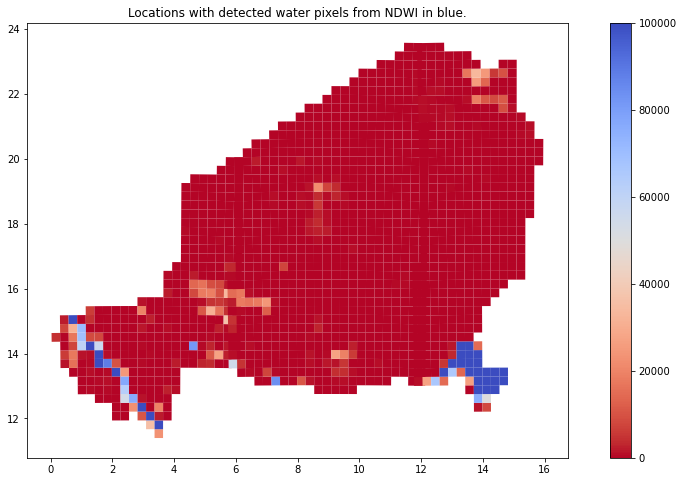

In [11]:
fig, axs = plt.subplots(figsize=(15, 8))
i=0
for gdf in gdfs_aggregated:
    gdf.to_crs(epsg=4326).plot(ax=axs, column="water_valid_pixels", cmap=plt.cm.coolwarm_r, vmin=0, vmax=1e5, legend=True if i==0 else False)
    i = i+1
axs.set_title("Locations with detected water pixels from NDWI in blue.")

Text(0.5, 1.0, 'Locations with no nominal water but detected water pixels over the period of analysis.')

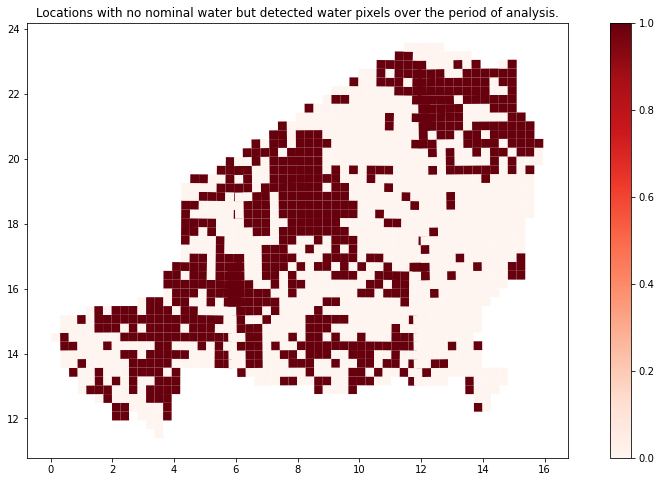

In [12]:
fig, axs = plt.subplots(figsize=(15, 8))
i=0
for gdf in gdfs_aggregated:
    gdf["new_water"] = (gdf["nominal_water_valid_pixels"] < 1) & (gdf["water_valid_pixels"] > 1.0)
    gdf.to_crs(epsg=4326).plot(ax=axs, column="new_water", cmap=plt.cm.Reds, legend=True if i==0 else False)
    i = i+1
axs.set_title("Locations with no nominal water but detected water pixels over the period of analysis.")


Text(0.5, 1.0, 'Locations where there is at least a detection of water over nominal for the period of analysis.')

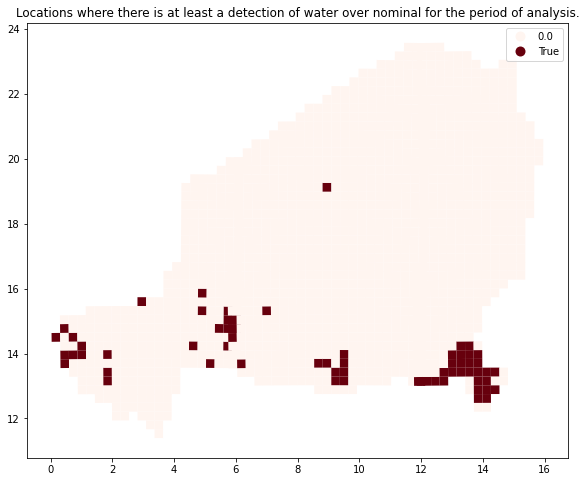

In [13]:
fig, axs = plt.subplots(figsize=(15, 8))
i=0
for gdf in gdfs_aggregated:
    gdf["water_fraction"] = (gdf["water_valid_pixels"] / gdf["nominal_water_valid_pixels"]) > 1.0
    gdf.loc[gdf["nominal_water_valid_pixels"]<1, "water_fraction"] = 0.0
    gdf.to_crs(epsg=4326).plot(ax=axs, column="water_fraction", cmap=plt.cm.Reds, legend=True if i==0 else False)
    i = i+1
axs.set_title("Locations where there is at least a detection of water over nominal for the period of analysis.")

# Temporal Analysis

In [14]:
gdfs = []

for layername in fiona.listlayers('aggregated_water-profiles.gpkg'):
    geopkg = gpd.read_file(r'aggregated_water-profiles.gpkg', layer=layername)
    gdfs.append(geopkg)
    i = 0
    for name in geopkg.columns:
        print(name)
        i += 1
        
gdf = pd.concat(gdfs)

gdf['time'] = gdf['TIMESTAMP'].apply(lambda x: pd.to_datetime(x))
gdf['times_overpassing_nominal_water'] = gdf.apply(lambda x: 1 if (x['water_valid_pixels'] > x['nominal_water_valid_pixels']) else 0, axis=1)
gdf['fraction'] = gdf.apply(lambda x: (x['water_valid_pixels']/x['nominal_water_valid_pixels']) if (x['nominal_water_valid_pixels'] > 0) else 0, axis=1)

gdf

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:639: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry
water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry
water_valid_pixels
nominal_water_valid_pixels
TIMESTAMP
eopatch
epsg
geometry


,water_valid_pixels,nominal_water_valid_pixels,TIMESTAMP,eopatch,epsg,geometry,time,times_overpassing_nominal_water,fraction
0,28,27,2019-01-07 10:36:51,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",2019-01-07 10:36:51,1,1.037037
1,36,27,2019-01-12 10:36:55,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",2019-01-12 10:36:55,1,1.333333
2,34,27,2019-01-17 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",2019-01-17 10:36:52,1,1.259259
3,37,27,2019-01-22 10:36:56,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",2019-01-22 10:36:56,1,1.370370
4,34,27,2019-01-27 10:36:52,eopatch-id-0000-col-0-row-11,32631,"POLYGON ((180000.000 1590000.000, 180000.000 1...",2019-01-27 10:36:52,1,1.259259
...,...,...,...,...,...,...,...,...,...
99158,3,0,2021-12-17 09:44:59,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",2021-12-17 09:44:59,1,0.000000
99159,3,0,2021-12-22 09:44:54,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",2021-12-22 09:44:54,1,0.000000
99160,4,0,2021-12-24 09:35:02,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",2021-12-24 09:35:02,1,0.000000
99161,3,0,2021-12-27 09:45:01,eopatch-id-1494-col-14-row-30,32633,"POLYGON ((570000.000 2250000.000, 570000.000 2...",2021-12-27 09:45:01,1,0.000000


In [15]:
monthly_means = gdf.groupby([pd.Grouper(key='time',freq='M'), 'eopatch'])[['water_valid_pixels','nominal_water_valid_pixels','fraction']].mean().reset_index()
monthly_days_over_nominal = gdf.groupby([pd.Grouper(key='time',freq='M'), 'eopatch'])[['times_overpassing_nominal_water']].sum().reset_index()
gdf2 = monthly_means.merge(monthly_days_over_nominal, left_on=['eopatch','time'], right_on=['eopatch', 'time'], how='inner')
gdf2 = gdf2.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
gdf2

,time,eopatch,water_valid_pixels,nominal_water_valid_pixels,fraction,times_overpassing_nominal_water,geometry,epsg
0,2019-01-31,eopatch-id-0000-col-0-row-11,33.800000,27.000000,1.251852,5,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631
1,2019-01-31,eopatch-id-0001-col-1-row-8,6.333333,1.666667,3.166667,5,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631
2,2019-01-31,eopatch-id-0002-col-1-row-9,91.200000,36.000000,2.533333,4,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631
3,2019-01-31,eopatch-id-0003-col-1-row-10,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631
4,2019-01-31,eopatch-id-0004-col-1-row-11,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631
...,...,...,...,...,...,...,...,...
53644,2021-12-31,eopatch-id-1490-col-13-row-31,0.555556,0.000000,0.000000,3,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633
53645,2021-12-31,eopatch-id-1491-col-13-row-32,13.250000,0.000000,0.000000,7,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633
53646,2021-12-31,eopatch-id-1492-col-14-row-28,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633
53647,2021-12-31,eopatch-id-1493-col-14-row-29,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633


In [16]:
crses = gdf2.epsg.unique()

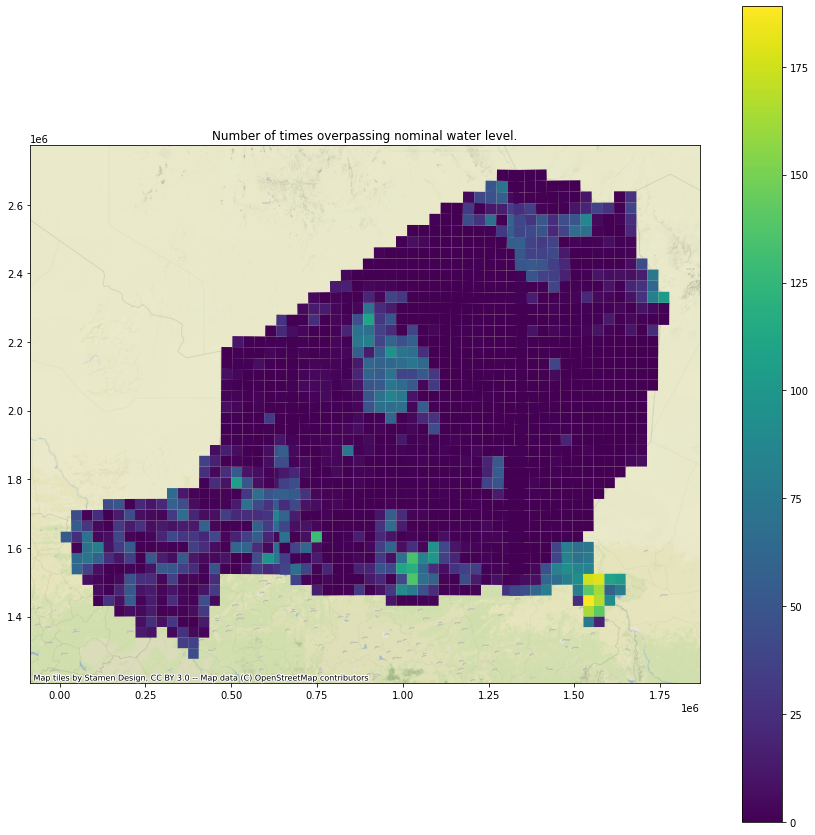

In [17]:
gdf4 = gdf2.groupby('eopatch', as_index=False)['times_overpassing_nominal_water'].sum()
gdf4 = gdf4.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
gdfs = []
for crs in crses:
            gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
            gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
            gdf5 = gdf5.to_crs("EPSG:3857")
            gdfs.append(gdf5)
            
gdf5 = pd.concat(gdfs)
ax = gdf5.plot('times_overpassing_nominal_water', figsize=(15,15), legend=True) 
ax.set_title("Number of times overpassing nominal water level.")

cx.add_basemap(ax, crs=gdf5.crs, zoom=9)

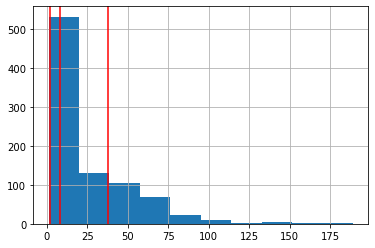

In [36]:
ax = gdf4[gdf4['times_overpassing_nominal_water'] > 0].times_overpassing_nominal_water.hist()
# only one line may be specified; ymin & ymax specified as a percentage of y-range
ax.axvline(x=2, color = 'r')
ax.axvline(x=8, color = 'r')
ax.axvline(x=38, color = 'r')

In [27]:
gdf4[gdf4['times_overpassing_nominal_water'] > 0].times_overpassing_nominal_water.quantile([.25,.5,.75])

0.25     2.0
0.50     8.0
0.75    38.0
Name: times_overpassing_nominal_water, dtype: float64

In [30]:
gdf4['CLASS'] = gdf4.times_overpassing_nominal_water.apply(lambda x: 0 if x < 2 else 1 if x < 8 else 2 if x < 38 else 3)
gdf4

,eopatch,times_overpassing_nominal_water,geometry,epsg,CLASS
0,eopatch-id-0000-col-0-row-11,53,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631,3
1,eopatch-id-0001-col-1-row-8,62,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631,3
2,eopatch-id-0002-col-1-row-9,64,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631,3
3,eopatch-id-0003-col-1-row-10,2,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631,1
4,eopatch-id-0004-col-1-row-11,25,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631,2
...,...,...,...,...,...
1490,eopatch-id-1490-col-13-row-31,62,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633,3
1491,eopatch-id-1491-col-13-row-32,75,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633,3
1492,eopatch-id-1492-col-14-row-28,0,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633,0
1493,eopatch-id-1493-col-14-row-29,1,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633,0


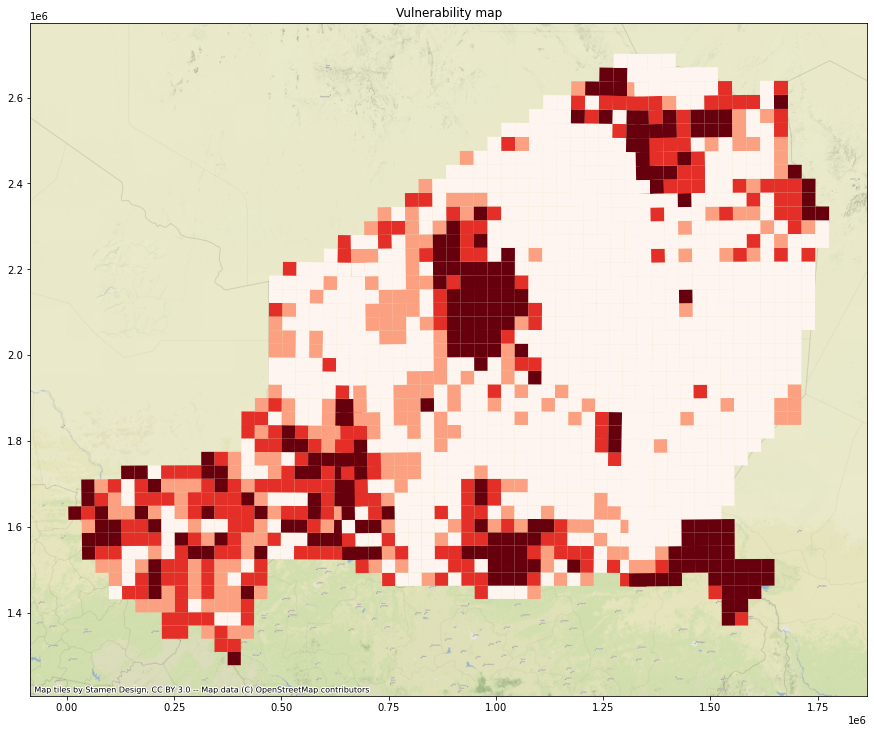

In [32]:
gdfs = []
for crs in crses:
            gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
            gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
            gdf5 = gdf5.to_crs("EPSG:3857")
            gdfs.append(gdf5)
            
gdf5 = pd.concat(gdfs)
ax = gdf5.plot('CLASS', figsize=(15,15), cmap='Reds') 
ax.set_title("Vulnerability map")

cx.add_basemap(ax, crs=gdf5.crs, zoom=9)

In [18]:
gdf2['month']  = pd.DatetimeIndex(gdf2['time']).month
gdf2

,time,eopatch,water_valid_pixels,nominal_water_valid_pixels,fraction,times_overpassing_nominal_water,geometry,epsg,month
0,2019-01-31,eopatch-id-0000-col-0-row-11,33.800000,27.000000,1.251852,5,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631,1
1,2019-01-31,eopatch-id-0001-col-1-row-8,6.333333,1.666667,3.166667,5,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631,1
2,2019-01-31,eopatch-id-0002-col-1-row-9,91.200000,36.000000,2.533333,4,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631,1
3,2019-01-31,eopatch-id-0003-col-1-row-10,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631,1
4,2019-01-31,eopatch-id-0004-col-1-row-11,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631,1
...,...,...,...,...,...,...,...,...,...
53644,2021-12-31,eopatch-id-1490-col-13-row-31,0.555556,0.000000,0.000000,3,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633,12
53645,2021-12-31,eopatch-id-1491-col-13-row-32,13.250000,0.000000,0.000000,7,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633,12
53646,2021-12-31,eopatch-id-1492-col-14-row-28,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633,12
53647,2021-12-31,eopatch-id-1493-col-14-row-29,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633,12


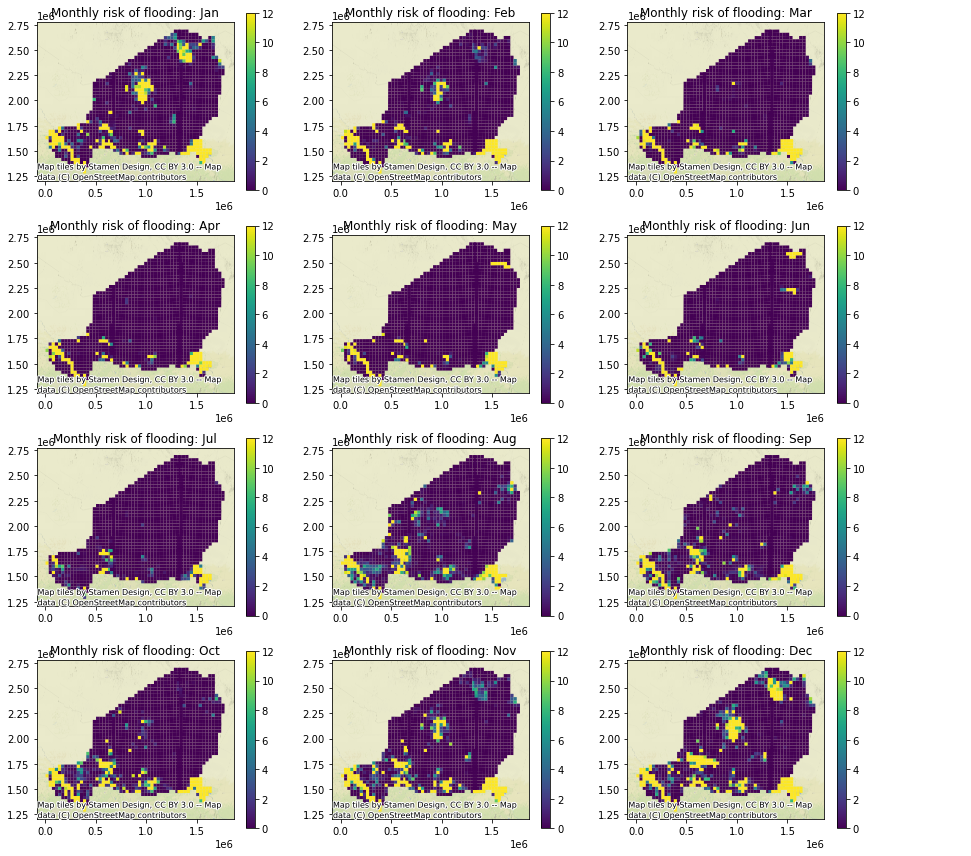

In [19]:
months = [None, # month 0 does not exist
         'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

ncols = 3
nrows = 4

fig, axes = plt.subplots(nrows,ncols, figsize=(15,15))

i=0
for month in gdf2.month.unique():
    
    crow = math.floor(i/ncols)
    ccol = i % ncols
    
    gdf4 = gdf2[gdf2['month'] == month].groupby(['eopatch'], as_index=False)['water_valid_pixels'].mean()
    gdf4 = gdf4.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
    gdfs = []
    for crs in crses:
                gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
                gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
                gdf5 = gdf5.to_crs("EPSG:3857")
                gdfs.append(gdf5)

    gdf5 = pd.concat(gdfs)
    gdf5.plot('water_valid_pixels', ax = axes[crow,ccol], legend=True, vmin=0, vmax=12) 
    axes[crow,ccol].set_title("Monthly risk of flooding: %s" % months[month])

    cx.add_basemap(axes[crow,ccol], crs=gdf5.crs, zoom=9)
    i =i+1

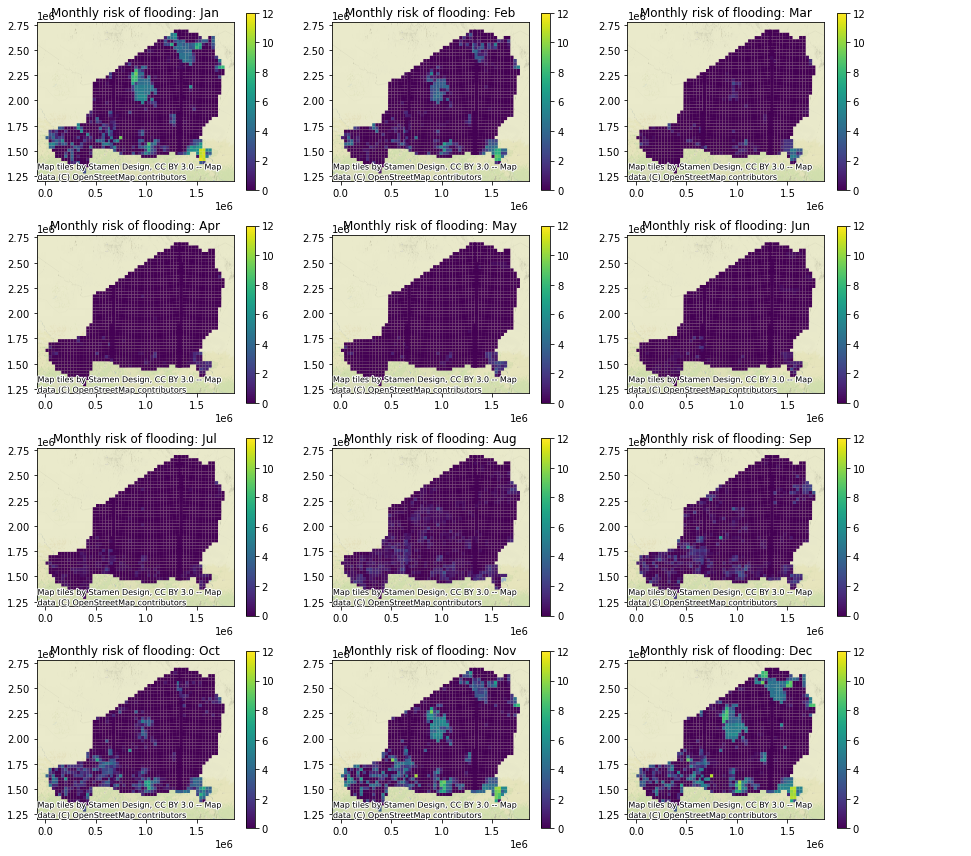

In [20]:
months = [None, # month 0 does not exist
         'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

ncols = 3
nrows = 4

fig, axes = plt.subplots(nrows,ncols, figsize=(15,15))

i=0
for month in gdf2.month.unique():
    
    crow = math.floor(i/ncols)
    ccol = i % ncols
    
    gdf4 = gdf2[gdf2['month'] == month].groupby(['eopatch'], as_index=False)['times_overpassing_nominal_water'].mean()
    gdf4 = gdf4.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
    gdfs = []
    for crs in crses:
                gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
                gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
                gdf5 = gdf5.to_crs("EPSG:3857")
                gdfs.append(gdf5)

    gdf5 = pd.concat(gdfs)
    gdf5.plot('times_overpassing_nominal_water', ax = axes[crow,ccol], legend=True, vmin=0, vmax=12) 
    axes[crow,ccol].set_title("Monthly risk of flooding: %s" % months[month])

    cx.add_basemap(axes[crow,ccol], crs=gdf5.crs, zoom=9)
    i =i+1

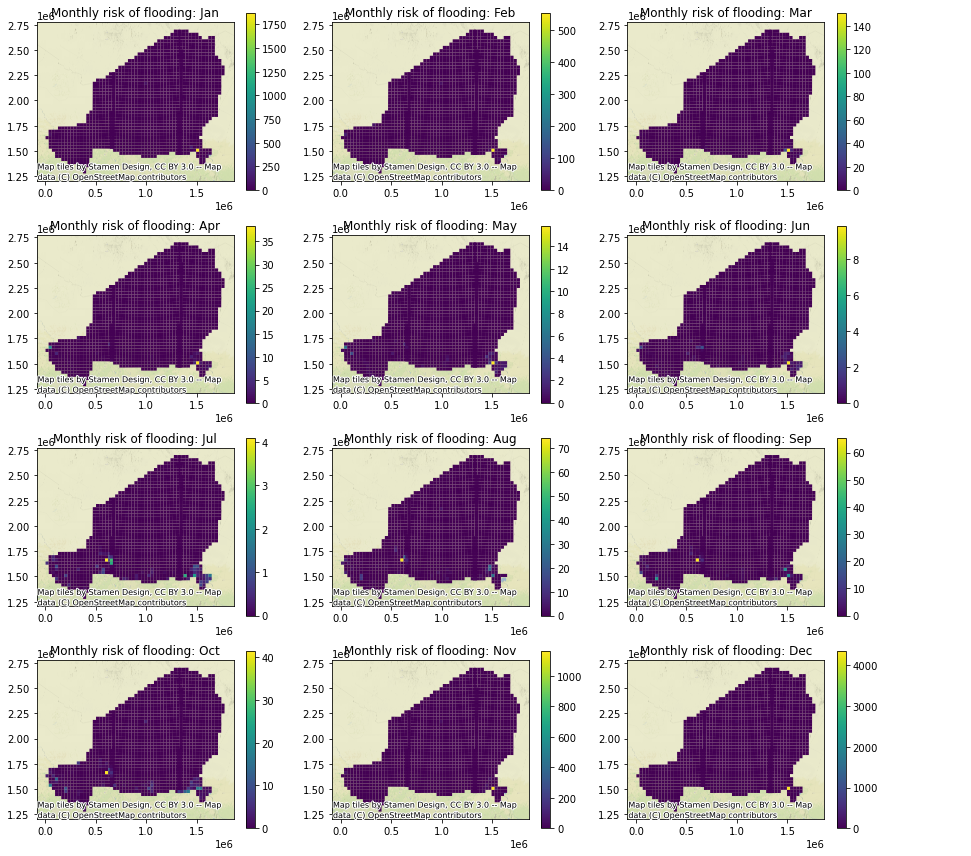

In [21]:
months = [None, # month 0 does not exist
         'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

ncols = 3
nrows = 4

fig, axes = plt.subplots(nrows,ncols, figsize=(15,15))

i=0
for month in gdf2.month.unique():
    
    crow = math.floor(i/ncols)
    ccol = i % ncols
    
    gdf4 = gdf2[gdf2['month'] == month].groupby(['eopatch'], as_index=False)['fraction'].mean()
    gdf4 = gdf4.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
    gdfs = []
    for crs in crses:
                gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
                gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
                gdf5 = gdf5.to_crs("EPSG:3857")
                gdfs.append(gdf5)

    gdf5 = pd.concat(gdfs)
    gdf5.plot('fraction', ax = axes[crow,ccol], legend=True)#, vmin=0, vmax=12) 
    axes[crow,ccol].set_title("Monthly risk of flooding: %s" % months[month])

    cx.add_basemap(axes[crow,ccol], crs=gdf5.crs, zoom=9)
    i =i+1

In [22]:
for month in gdf2.month.unique():
    qtiles = gdf2.groupby(['eopatch','month']).quantile([0,.05, .1,.25,.75,.9,.95,1]).reset_index()
    

qtiles

,eopatch,month,level_2,water_valid_pixels,nominal_water_valid_pixels,fraction,times_overpassing_nominal_water,epsg
0,eopatch-id-0000-col-0-row-11,1,0.00,18.600000,27.0,0.688889,0.0,32631.0
1,eopatch-id-0000-col-0-row-11,1,0.05,20.120000,27.0,0.745185,0.5,32631.0
2,eopatch-id-0000-col-0-row-11,1,0.10,21.640000,27.0,0.801481,1.0,32631.0
3,eopatch-id-0000-col-0-row-11,1,0.25,26.200000,27.0,0.970370,2.5,32631.0
4,eopatch-id-0000-col-0-row-11,1,0.75,36.971429,27.0,1.369312,5.5,32631.0
...,...,...,...,...,...,...,...,...
143491,eopatch-id-1494-col-14-row-30,12,0.25,2.437500,0.0,0.000000,8.0,32633.0
143492,eopatch-id-1494-col-14-row-30,12,0.75,2.550000,0.0,0.000000,9.5,32633.0
143493,eopatch-id-1494-col-14-row-30,12,0.90,2.580000,0.0,0.000000,9.8,32633.0
143494,eopatch-id-1494-col-14-row-30,12,0.95,2.590000,0.0,0.000000,9.9,32633.0


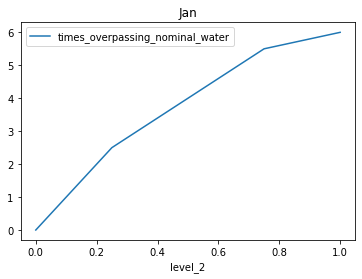

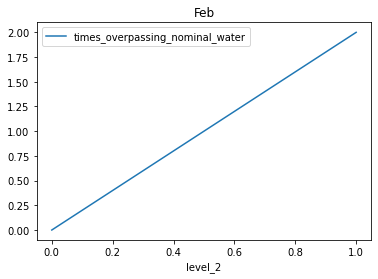

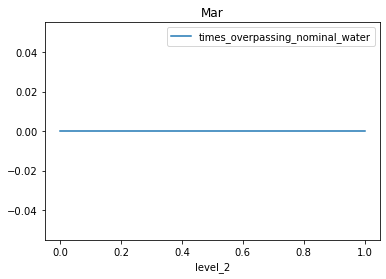

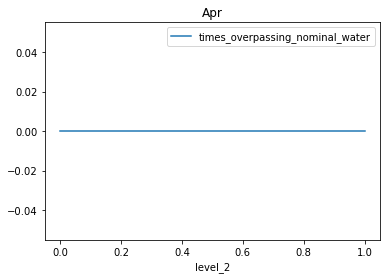

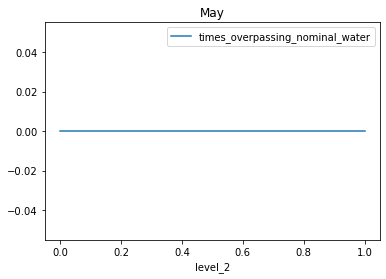

...

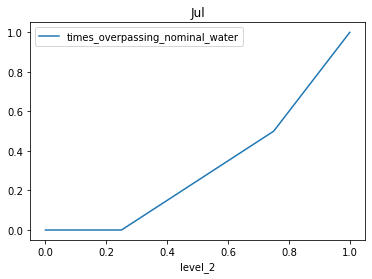

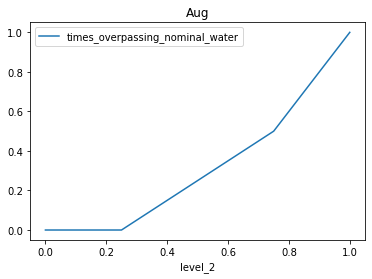

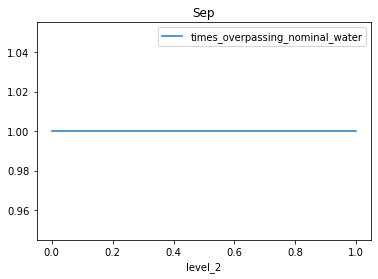

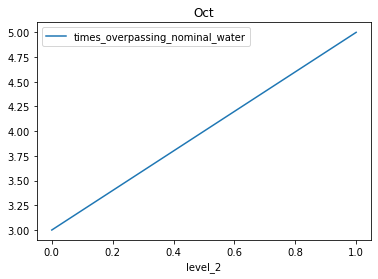

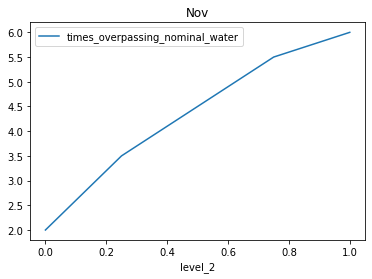

In [40]:
for month in list(set(range(12)) - set([0])):
    ax = qtiles[(qtiles.month == month) & (qtiles.eopatch == 'eopatch-id-0000-col-0-row-11')].plot('level_2','times_overpassing_nominal_water')
    ax.set_title(months[month])
    
    

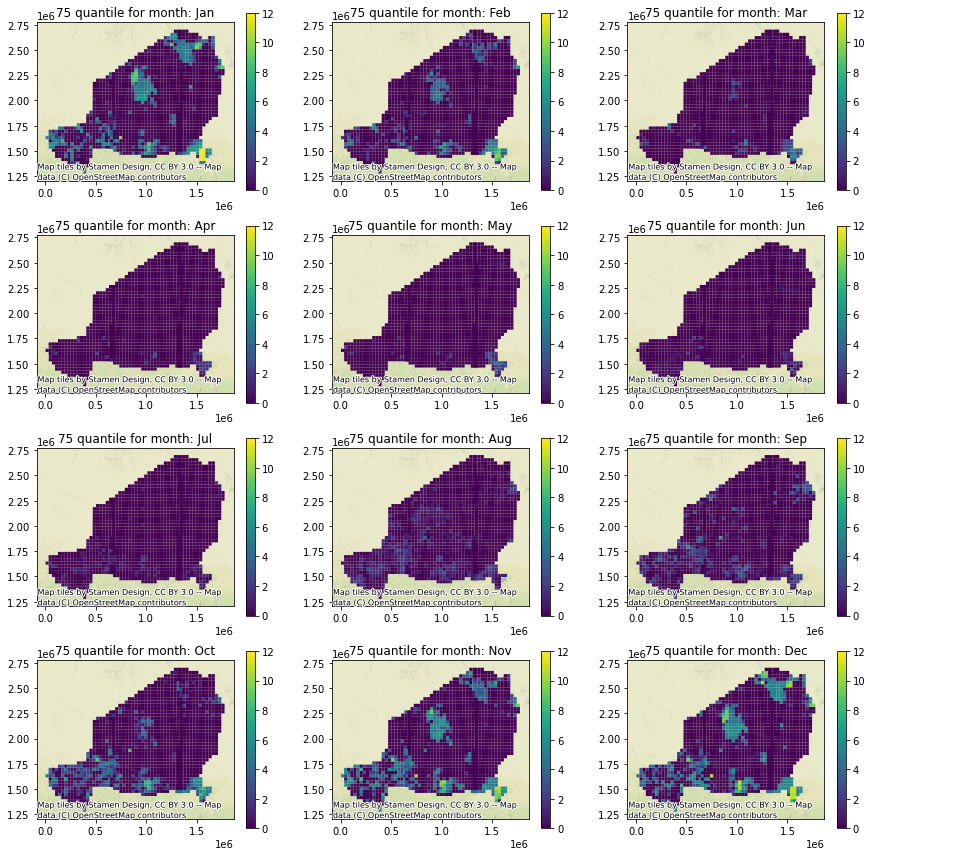

In [42]:
months = [None, # month 0 does not exist
         'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

ncols = 3
nrows = 4

fig, axes = plt.subplots(nrows,ncols, figsize=(15,15))

i=0
for month in qtiles.month.unique():
    
    crow = math.floor(i/ncols)
    ccol = i % ncols
    
    gdf4 = qtiles[(qtiles.month == month)&(qtiles.level_2 == 0.75)].groupby(['eopatch'], as_index=False)['times_overpassing_nominal_water'].mean()
    gdf4 = gdf4.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
    gdfs = []
    for crs in crses:
                gdf5 = gdf4[gdf4.epsg == crs].copy().set_geometry('geometry')
                gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
                gdf5 = gdf5.to_crs("EPSG:3857")
                gdfs.append(gdf5)

    gdf5 = pd.concat(gdfs)
    gdf5.plot('times_overpassing_nominal_water', ax = axes[crow,ccol], legend=True, vmin=0, vmax=12) 
    axes[crow,ccol].set_title("75 quantile for month: %s" % months[month])

    cx.add_basemap(axes[crow,ccol], crs=gdf5.crs, zoom=9)
    i =i+1

In [23]:
gdf4 = gdf2.copy()
gdf4['CAT'] = gdf4.apply(lambda x: qtiles[(qtiles.month == x.month) & (qtiles.eopatch == x.eopatch) & ((qtiles.times_overpassing_nominal_water - x.times_overpassing_nominal_water) >= 0)].iloc[0].level_2, axis=1)

In [24]:
gdf4['CAT2'] = gdf4['CAT'].apply(lambda x: (10 if x == 0 else 5 if x == 0.05 else 2 if x == 0.1 else 1 if x == 0.25 else 2 if x == 0.75 else 5 if x == 0.9 else 10 if x == 0.95 else 10))

In [25]:
gdf4['CAT3'] = gdf4['CAT'].apply(lambda x: (0 if x < 0.75 else 5 if x == 0.9 else 10 if x == 0.95 else 10))

In [26]:
gdf4['year']  = pd.DatetimeIndex(gdf2['time']).year
gdf4

,time,eopatch,water_valid_pixels,nominal_water_valid_pixels,fraction,times_overpassing_nominal_water,geometry,epsg,month,CAT,CAT2,CAT3,year
0,2019-01-31,eopatch-id-0000-col-0-row-11,33.800000,27.000000,1.251852,5,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631,1,0.75,2,10,2019
1,2019-01-31,eopatch-id-0001-col-1-row-8,6.333333,1.666667,3.166667,5,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631,1,0.75,2,10,2019
2,2019-01-31,eopatch-id-0002-col-1-row-9,91.200000,36.000000,2.533333,4,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631,1,0.00,10,0,2019
3,2019-01-31,eopatch-id-0003-col-1-row-10,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631,1,0.00,10,0,2019
4,2019-01-31,eopatch-id-0004-col-1-row-11,0.000000,0.000000,0.000000,0,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631,1,0.00,10,0,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53644,2021-12-31,eopatch-id-1490-col-13-row-31,0.555556,0.000000,0.000000,3,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633,12,0.75,2,10,2021
53645,2021-12-31,eopatch-id-1491-col-13-row-32,13.250000,0.000000,0.000000,7,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633,12,1.00,10,10,2021
53646,2021-12-31,eopatch-id-1492-col-14-row-28,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633,12,0.00,10,0,2021
53647,2021-12-31,eopatch-id-1493-col-14-row-29,0.000000,0.000000,0.000000,0,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633,12,0.00,10,0,2021


<ipython-input-27-dd17758aac02>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gdf5 = gdf4[(gdf4.month == month) & (gdf4.year == year)][gdf4.epsg == crs].copy().set_geometry('geometry')
<ipython-input-27-dd17758aac02>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gdf5 = gdf4[(gdf4.month == month) & (gdf4.year == year)][gdf4.epsg == crs].copy().set_geometry('geometry')
<ipython-input-27-dd17758aac02>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gdf5 = gdf4[(gdf4.month == month) & (gdf4.year == year)][gdf4.epsg == crs].copy().set_geometry('geometry')
<ipython-input-27-dd17758aac02>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gdf5 = gdf4[(gdf4.month == month) & (gdf4.year == year)][gdf4.epsg == crs].copy().set_geometry('geometry')
<ipython-input-27-dd17758aac02>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  gd

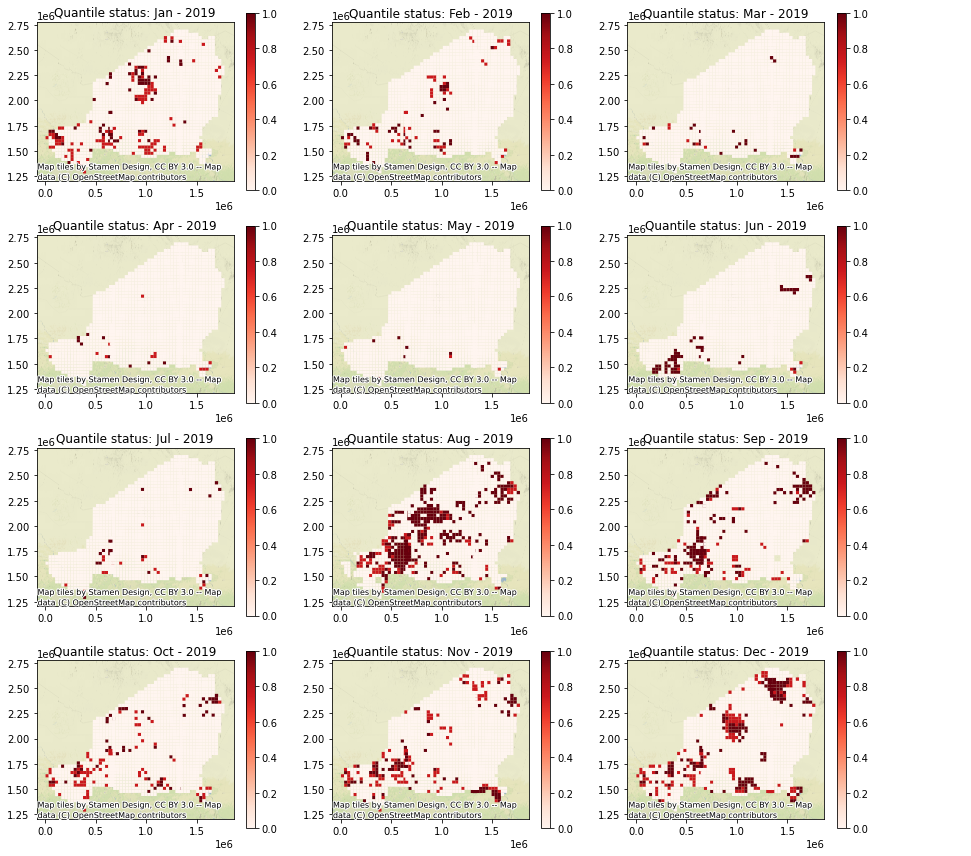

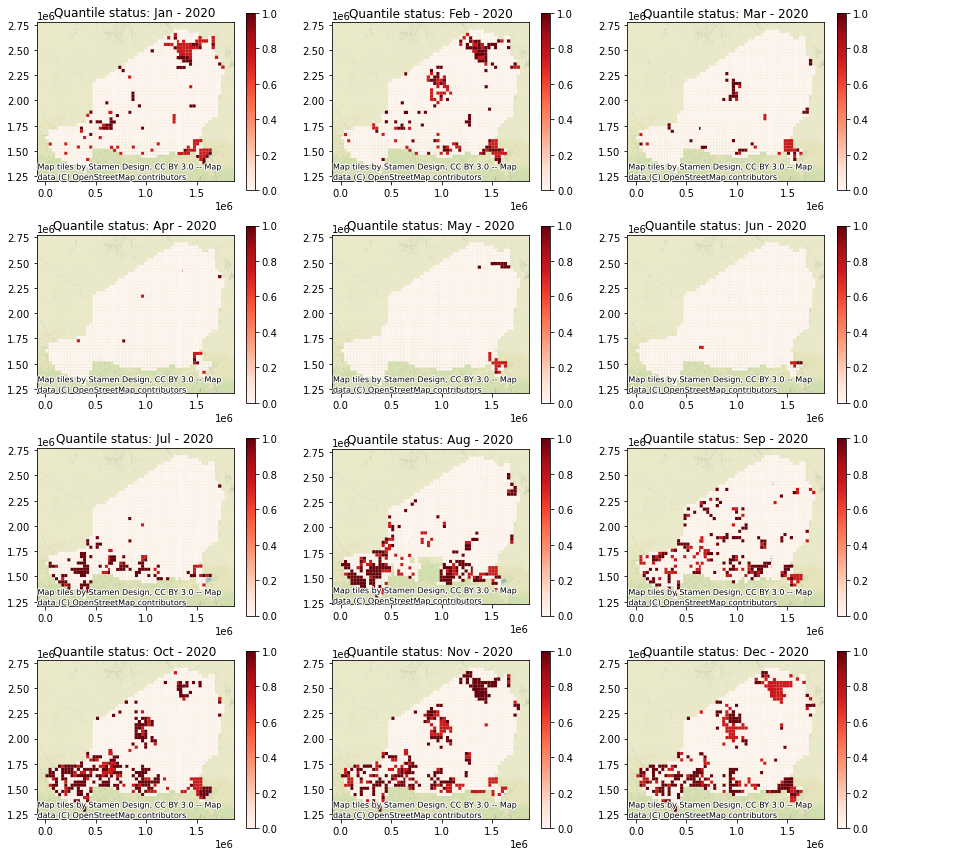

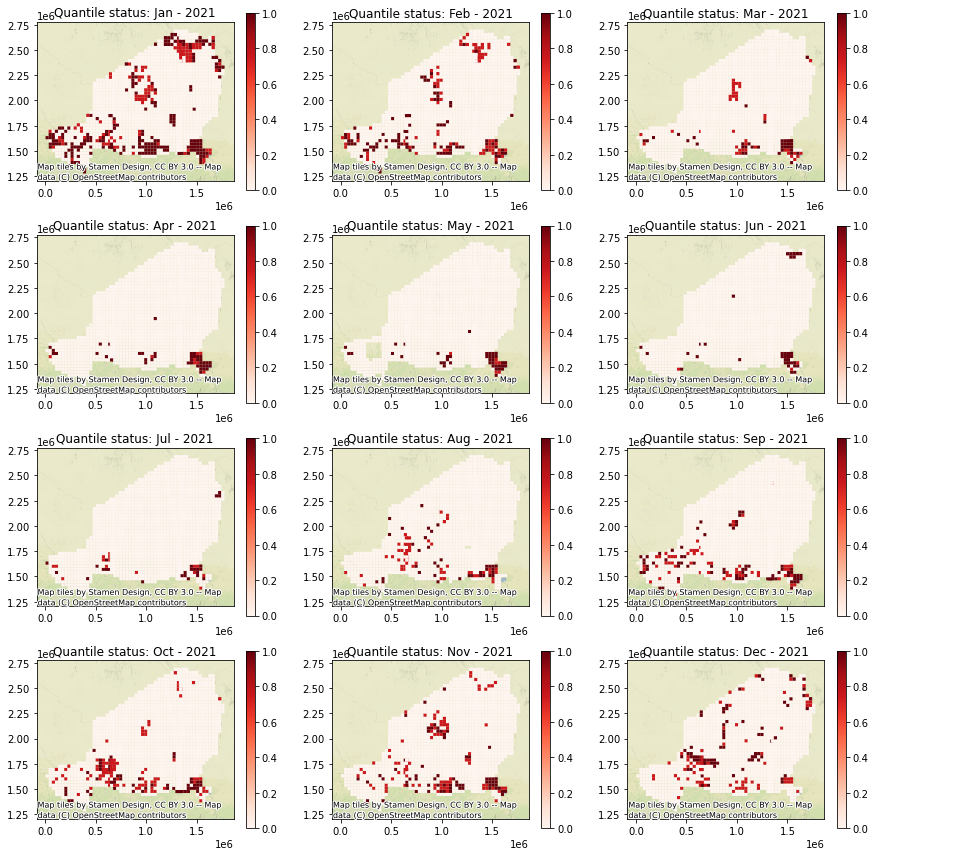

In [27]:
ncols = 3
nrows = 4



for year in gdf4.year.unique():
    fig, axes = plt.subplots(nrows,ncols, figsize=(15,15))
    i=0
    for month in gdf4.month.unique():

        crow = math.floor(i/ncols)
        ccol = i % ncols

        gdfs = []
        for crs in crses:
                    gdf5 = gdf4[(gdf4.month == month) & (gdf4.year == year)][gdf4.epsg == crs].copy().set_geometry('geometry')
                    gdf5 = gdf5.set_crs(epsg=crs, allow_override=True)
                    gdf5 = gdf5.to_crs("EPSG:3857")
                    gdfs.append(gdf5)

        gdf5 = pd.concat(gdfs)
        gdf5.plot('CAT', ax = axes[crow,ccol], legend=True, vmin=0, vmax=1, cmap='Reds') 
        axes[crow,ccol].set_title("Quantile status: %s - %s" % (months[month],year))

        cx.add_basemap(axes[crow,ccol], crs=gdf5.crs, zoom=9)
        i =i+1

# Seasonality?

In [37]:
seasonality = gdf2.set_index('time').groupby(['eopatch'])['times_overpassing_nominal_water'].apply(lambda x: x.autocorr(lag=12)).reset_index(name='autocorrelation')
gdf6 = seasonality.merge(gdf_patch_geometries, left_on=['eopatch'],right_on=['eopatch'], how='left')
gdf6

,eopatch,autocorrelation,geometry,epsg
0,eopatch-id-0000-col-0-row-11,0.497083,"POLYGON ((180000.000 1590000.000, 180000.000 1...",32631
1,eopatch-id-0001-col-1-row-8,0.646247,"POLYGON ((210000.000 1500000.000, 210000.000 1...",32631
2,eopatch-id-0002-col-1-row-9,0.738908,"POLYGON ((210000.000 1530000.000, 210000.000 1...",32631
3,eopatch-id-0003-col-1-row-10,-0.090909,"POLYGON ((210000.000 1560000.000, 210000.000 1...",32631
4,eopatch-id-0004-col-1-row-11,-0.293803,"POLYGON ((210000.000 1590000.000, 210000.000 1...",32631
...,...,...,...,...
1490,eopatch-id-1490-col-13-row-31,-0.058777,"POLYGON ((540000.000 2280000.000, 540000.000 2...",32633
1491,eopatch-id-1491-col-13-row-32,0.738578,"POLYGON ((540000.000 2310000.000, 540000.000 2...",32633
1492,eopatch-id-1492-col-14-row-28,NaN,"POLYGON ((570000.000 2190000.000, 570000.000 2...",32633
1493,eopatch-id-1493-col-14-row-29,-0.043478,"POLYGON ((570000.000 2220000.000, 570000.000 2...",32633


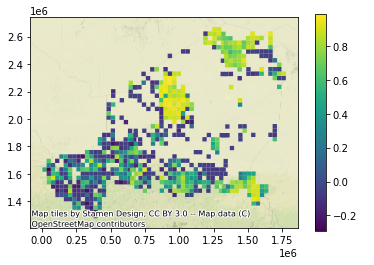

In [38]:
gdfs = []
for crs in crses:
            gdf7 = gdf6[gdf6.epsg == crs].copy().set_geometry('geometry')
            gdf7 = gdf7.set_crs(epsg=crs, allow_override=True)
            gdf7 = gdf7.to_crs("EPSG:3857")
            gdfs.append(gdf7)

gdf7 = pd.concat(gdfs)
ax = gdf7.plot('autocorrelation',  legend=True)#, vmin=0, vmax=12) 


cx.add_basemap(ax, crs=gdf5.crs, zoom=9)

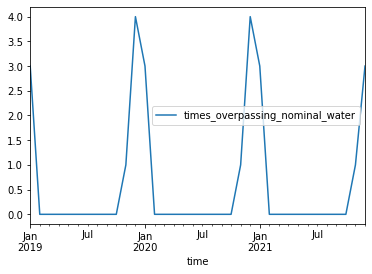

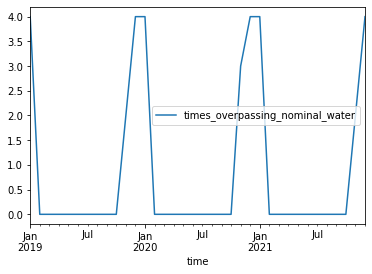

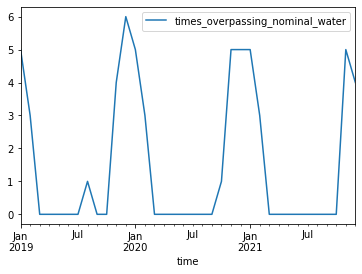

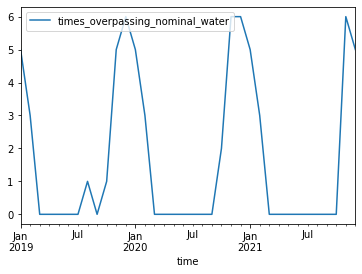

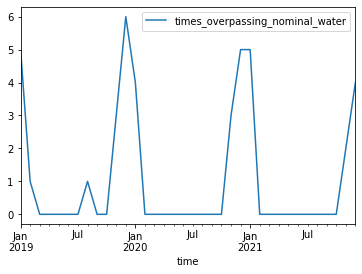

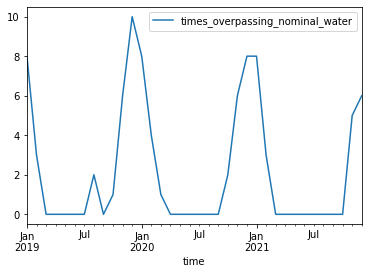

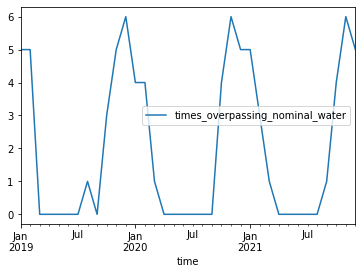

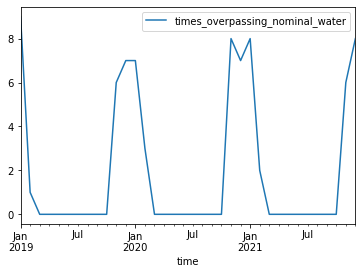

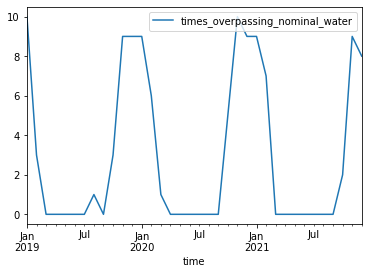

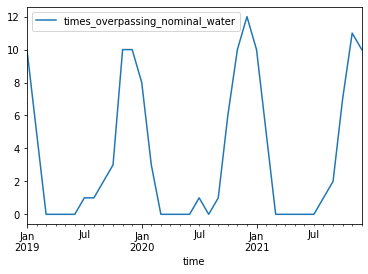

In [30]:
for patch in gdf6.nlargest(10,['autocorrelation'])['eopatch'].values:
    gdf2[gdf2['eopatch'] == patch ].plot('time','times_overpassing_nominal_water')

/opt/conda/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


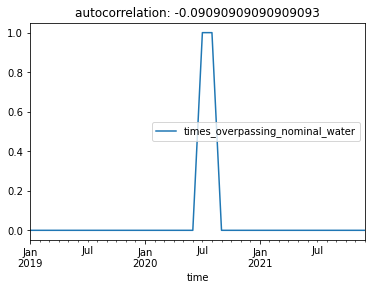

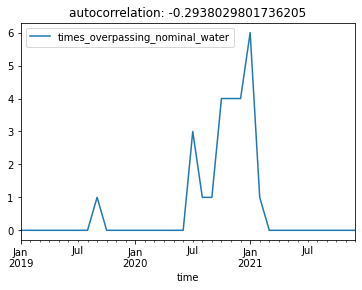

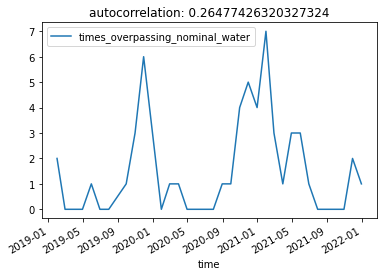

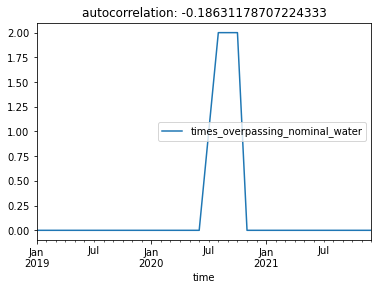

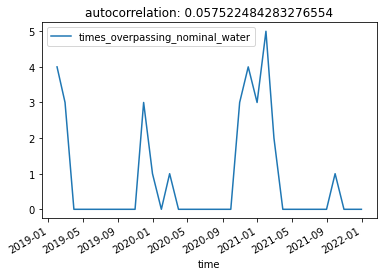

...

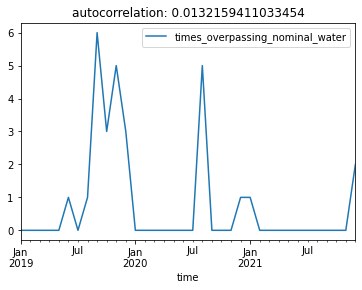

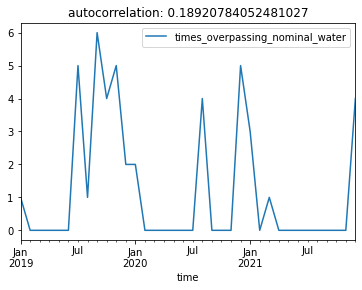

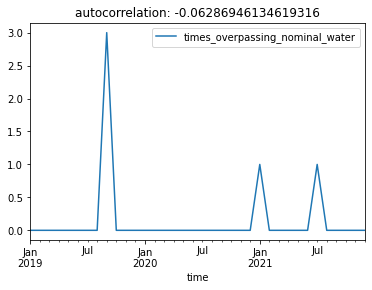

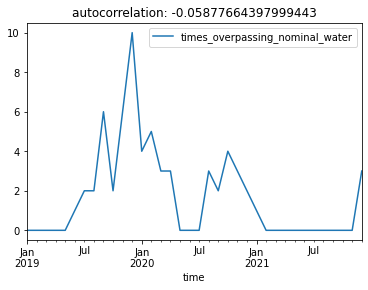

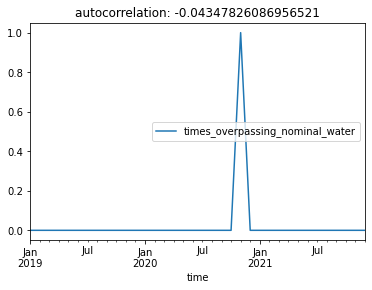

In [44]:
for patch in gdf6[gdf6['autocorrelation'] < 0.3]['eopatch'].values:
    gdf2[gdf2['eopatch'] == patch ].plot('time','times_overpassing_nominal_water', title="autocorrelation: %s" % gdf6[gdf6['eopatch'] == patch]['autocorrelation'].values[0])

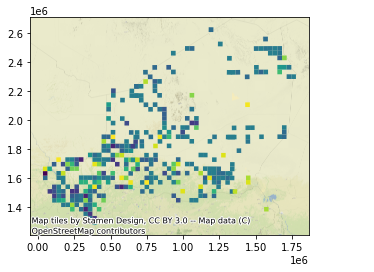

In [43]:
gdfs = []
for crs in crses:
    gdf7 = gdf6[gdf6.epsg == crs].copy().set_geometry('geometry')
    gdf7 = gdf7[gdf7.eopatch.isin(gdf6[gdf6['autocorrelation'] < 0.3].eopatch.values)]
    gdf7 = gdf7.set_crs(epsg=crs, allow_override=True)
    gdf7 = gdf7.to_crs("EPSG:3857")
    gdfs.append(gdf7)

gdf7 = pd.concat(gdfs)
ax = gdf7.plot('autocorrelation')#,  legend=True)#, vmin=0, vmax=12) 


cx.add_basemap(ax, crs=gdf5.crs, zoom=9)